In [1]:
#This file is the successor to ML1. Functions are a bit more modular
#draws functions from jurrefuncs.py
#will use this file to study the correlations of the multi cluster data when it becomes available
from jurrefuncs import *
import numpy as np


In [2]:
import matplotlib.pyplot as plt
def show_slices(slices):
    fig, axes = plt.subplots(1, len(slices))
    for i, slice in enumerate(slices):
        axes[i].imshow(slice.T, cmap="gray", origin="lower")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)


C:\Users\ia\Anaconda3\lib\site-packages\skimage\exposure\exposure.py:307: RuntimeWarning: invalid value encountered in true_divide
  image = (image - imin) / float(imax - imin)


(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 176, 208)
(176, 17

C:\Users\ia\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


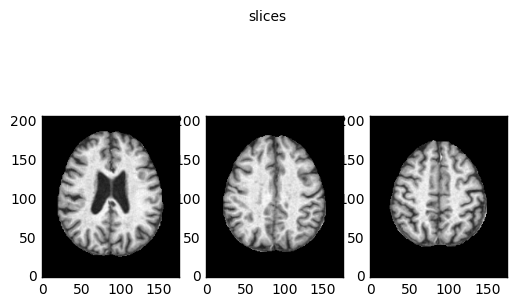

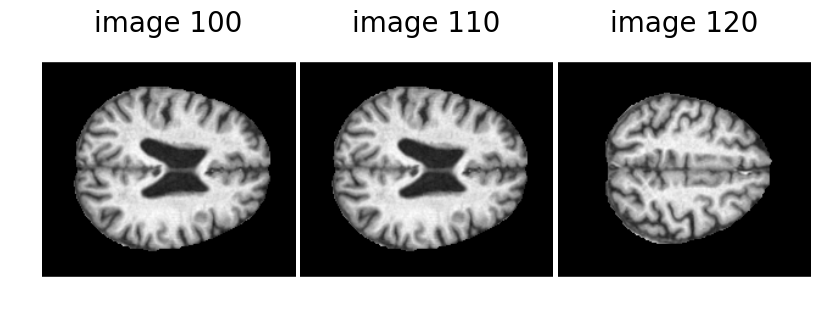

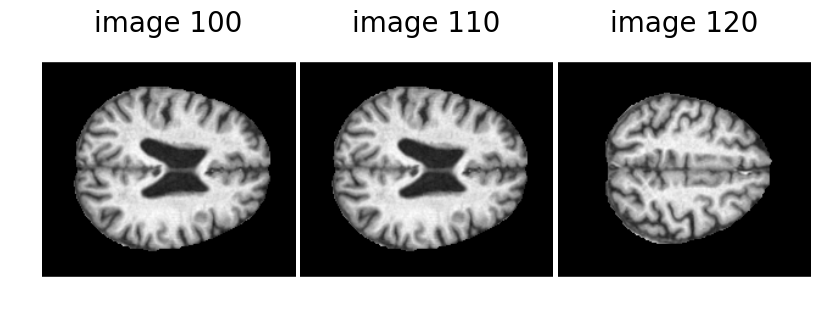

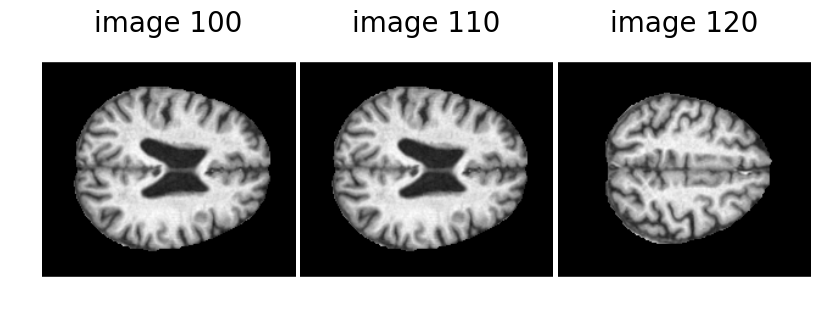

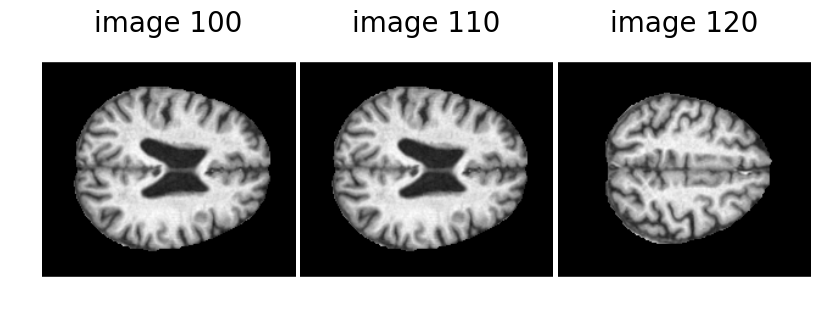

...

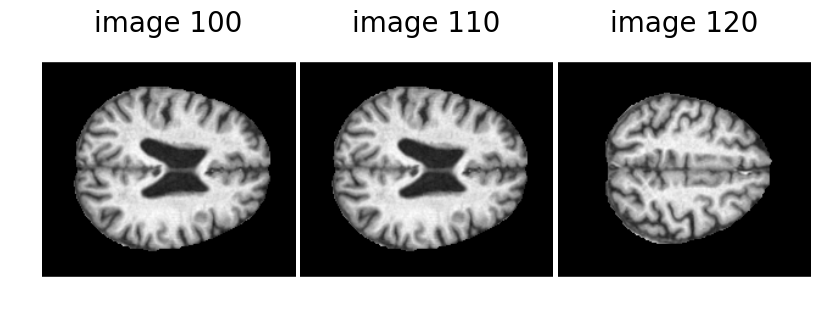

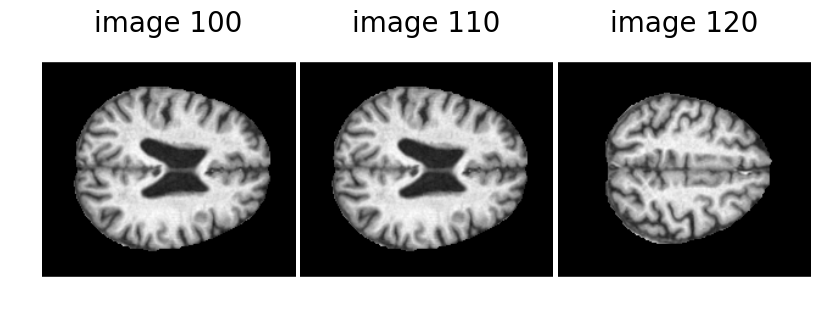

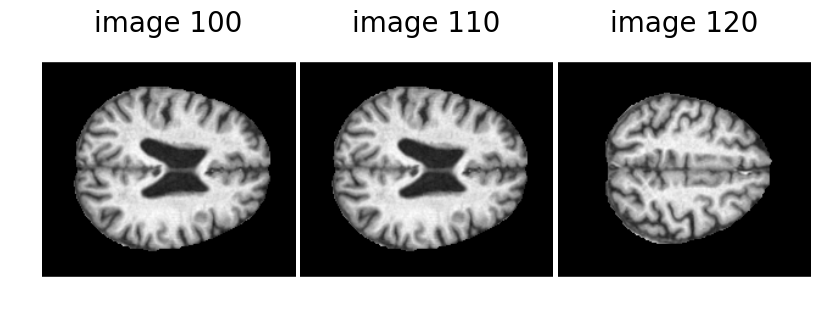

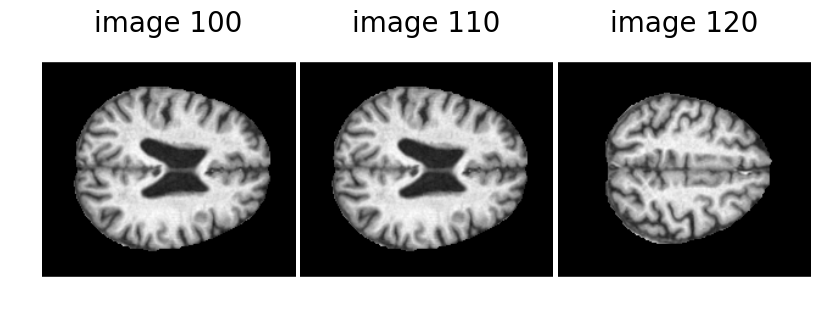

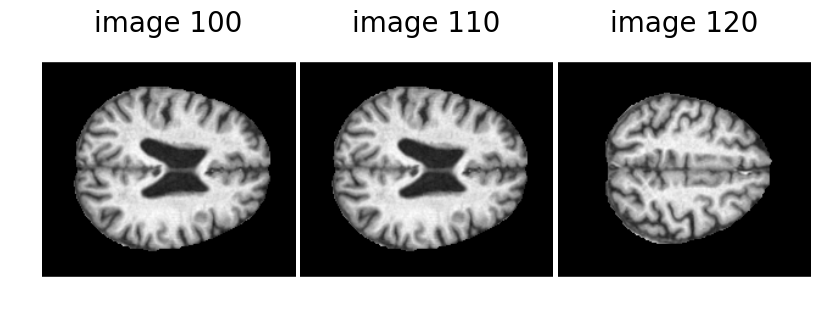

In [15]:
import os
import nibabel as nib
from nibabel.testing import data_path
from skimage import exposure
from skimage import feature
from skimage.filters import roberts, sobel

slice_list = []
dataFile_size = 138
n1_img_list = []
img_data_list = []
for i in range(dataFile_size-1):
    file_name = "\\ETH\\data\\set_test\\test_" + str(i+1) + ".nii"
    dataFile_path = os.path.join(data_path, file_name)
    n1_img = nib.load(dataFile_path)
    n1_img_list.append(n1_img)
    img_data = n1_img.get_data()
    img_data_list.append(img_data)
   
 
for j in range(dataFile_size-1):
    #slice = np.zeros((176,176,208))
    print(j)
    img_data = img_data_list[j] 
    for i in range(175):
        slice[i] = np.array(img_data[:,:,i,0])
    slice_list.append(slice)                          
    
print(slice_list[0].shape)    

for j in range(dataFile_size-1):
    slice = slice_list[j]
    for i in range(175):
        slice[i] = exposure.rescale_intensity(slice[i], out_range=(0, 256))
    slice_list[j] = slice 
    print(slice_list[j].shape)

show_slices([slice[100], slice[110], slice[120]])
    

plt.suptitle("slices")

edges = np.zeros((176,176,208))
for j in range(dataFile_size-1):
    slice = slice_list[j]
    for i in range(175):
        edges[i] = sobel(slice[i])
    slice_list[j] = edges
    save_img = nib.Nifti1Image(edges, np.eye(4))
    file_name = "\\ETH\\data\\set_test\\test_" + str(j+1) + "_m.nii"
    save_dataFile_path = os.path.join(data_path, file_name)
    nib.save(save_img, save_dataFile_path)

    # display results
    fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(8, 3), sharex=True, sharey=True)

    ax1.imshow(slice[100], cmap="gray", origin="lower")
    ax1.axis('off')
    ax1.set_title('image 100', fontsize=20)

    ax2.imshow(slice[100], cmap=plt.cm.gray)
    ax2.axis('off')
    ax2.set_title('image 110', fontsize=20)

    ax3.imshow(slice[120], cmap=plt.cm.gray)
    ax3.axis('off')
    ax3.set_title('image 120', fontsize=20)

    fig.subplots_adjust(wspace=0.02, hspace=0.02, top=0.9,
                        bottom=0.02, left=0.02, right=0.98)

plt.show()
